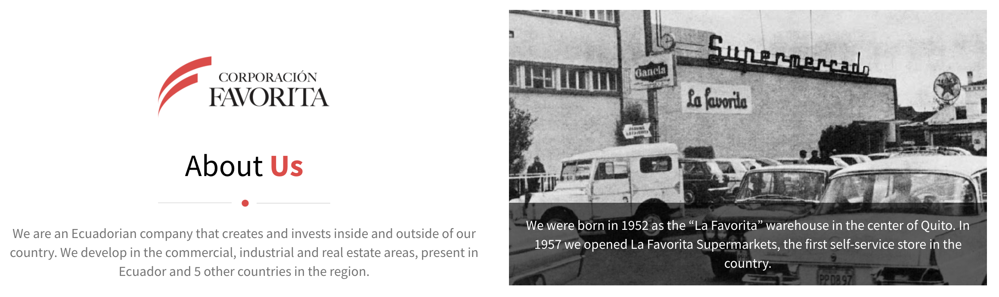

# Exploratory Data Analysis on Store Sales Data

####  The goal of this competation is to help an Ecuador company as known as Corporación Favorita to predict store sales for each product family and store combinations. 

#### We have 6 datasets: holiday_events, oil price, stores, earthquake, transactiontest, train and test data. 

#### I want to apply data cleaning methods to detect outliers and missing values and conduct univariate and bivariate analysis to understand explore holiday, earthquake, oil price, seasonal effect on sales/transactions.

#### Let's get started:)

## 1. Import Packages

In [5]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
from sklearn.metrics import auc, roc_curve, classification_report
import plotly.express as px

## 2. Importing Data

In [6]:
holiday_table = pd.read_csv('holidays_events.csv')
oil_table = pd.read_csv('oil.csv')
# Missing value
oil_table.isnull().sum()
#Fill in missing value
oil_table = oil_table.fillna(value=0)
stores_table = pd.read_csv('stores.csv')
test_table = pd.read_csv('test.csv')
train_table = pd.read_csv('train.csv')
transactions_table = pd.read_csv('transactions.csv')
sample_table = pd.read_csv('sample_submission.csv')

## 3. Univariate Analysis

I want to explore every table to understand data pattern and characteristics to give a general hypothesis for future multivariate analysis and feature selection.

### 3.1 Store_Table

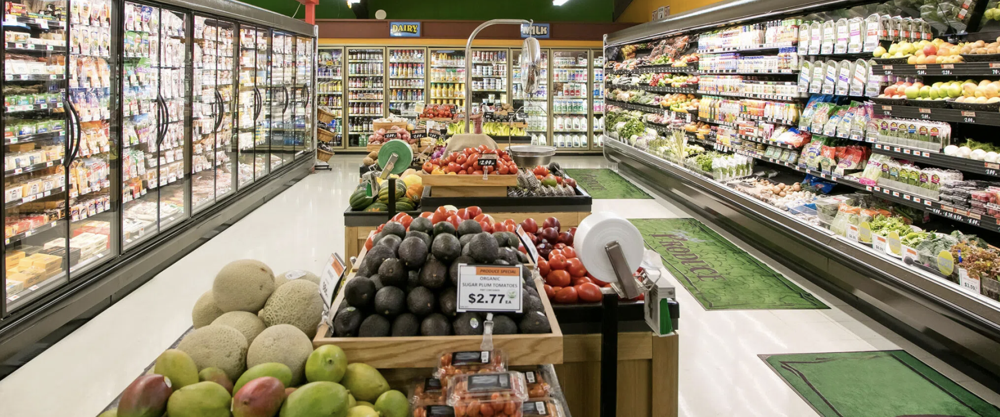

#### Average sales by store number and product family:

In [7]:
store_sales_sort = train_table.groupby('store_nbr')['sales'].agg(['mean']).sort_values(by = 'mean',ascending=False)[:20]
print(store_sales_sort)
store_sales_sort_family= train_table.groupby('family')['sales'].agg(['mean']).sort_values(by = 'mean',ascending=False)
print(store_sales_sort_family)

                  mean
store_nbr             
44         1117.245254
45          980.673908
47          916.798209
3           908.405495
49          781.330450
46          753.905962
48          646.604950
51          592.231511
8           548.734739
50          515.601753
11          509.709179
7           484.993334
9           475.229271
6           453.172101
24          427.692592
2           387.918172
39          364.431594
37          359.365069
27          345.282181
4           340.273886
                                   mean
family                                 
GROCERY I                   3776.972100
BEVERAGES                   2385.793151
PRODUCE                     1349.352123
CLEANING                    1072.416744
DAIRY                        709.154889
BREAD/BAKERY                 463.336254
POULTRY                      350.532292
MEATS                        341.849965
PERSONAL CARE                270.432513
DELI                         265.135067
HOME CARE     

#### Sales rank by cluster:

In [8]:
# merge train_table with stores_table to rank sales by cluster
cluster_info = pd.merge(left=stores_table, right=train_table, how='left', on='store_nbr')
store_sales_sort_cluster= cluster_info.groupby('cluster')['sales'].agg(['mean']).sort_values(by = 'mean',ascending=False)
print(store_sales_sort_cluster)

#Cluster grouping rules - type
cluster_filter_rules1=cluster_info.groupby('cluster')['type'].apply(lambda x:x.str.cat(sep=':')).reset_index()
pd.set_option('display.max_rows', None)
pd.set_option('max_colwidth',200)
pd.crosstab(cluster_info['cluster'],cluster_info['type'])

cluster_info['type'].value_counts() / cluster_info.shape[0]

cluster_info['cluster'].value_counts() / cluster_info.shape[0]

                mean
cluster             
5        1117.245254
14        708.227718
8         647.377856
11        603.507018
17        592.231511
6         342.661732
1         326.163967
12        324.461406
13        324.364108
4         296.572872
9         274.968339
2         260.170621
10        255.897546
16        238.598137
15        199.010111
3         194.416262
7         139.261863


3     0.129630
6     0.111111
10    0.111111
15    0.092593
13    0.074074
14    0.074074
11    0.055556
4     0.055556
8     0.055556
1     0.055556
9     0.037037
7     0.037037
2     0.037037
12    0.018519
5     0.018519
16    0.018519
17    0.018519
Name: cluster, dtype: float64

In [9]:
pd.crosstab(cluster_info['cluster'],cluster_info['type'])

type,A,B,C,D,E
cluster,,,,,
1,0,0,0,166716,0
2,0,0,0,111144,0
3,0,0,389004,0,0
4,0,0,0,166716,0
5,55572,0,0,0,0
6,0,333432,0,0,0
7,0,0,111144,0,0
8,0,0,0,166716,0
9,0,0,0,111144,0


#### We can conclude that clusters are divided by types.

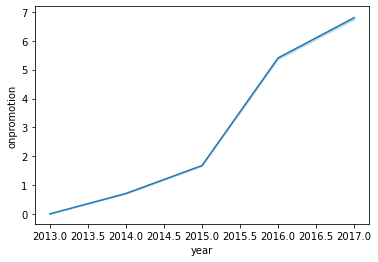

In [30]:
sns.lineplot(x="year", y="onpromotion", data =cluster_info)
plt.show()

#### We can see a growing trend on number of promotions. It is possible that promotions strongly increased sales so more merchants start to make promotions. Thus, we could focus on relationship between sales and number of promotions.

### 3.2 Holiday Table

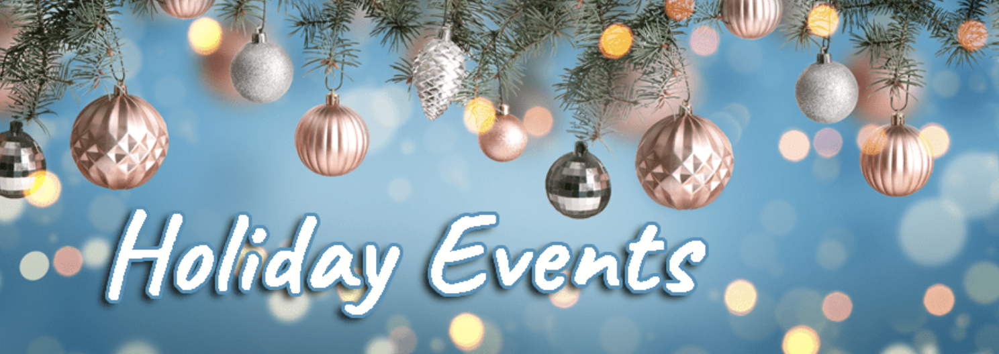

<AxesSubplot:title={'center':'Counts of type of holiday'}, xlabel='locale', ylabel='count'>

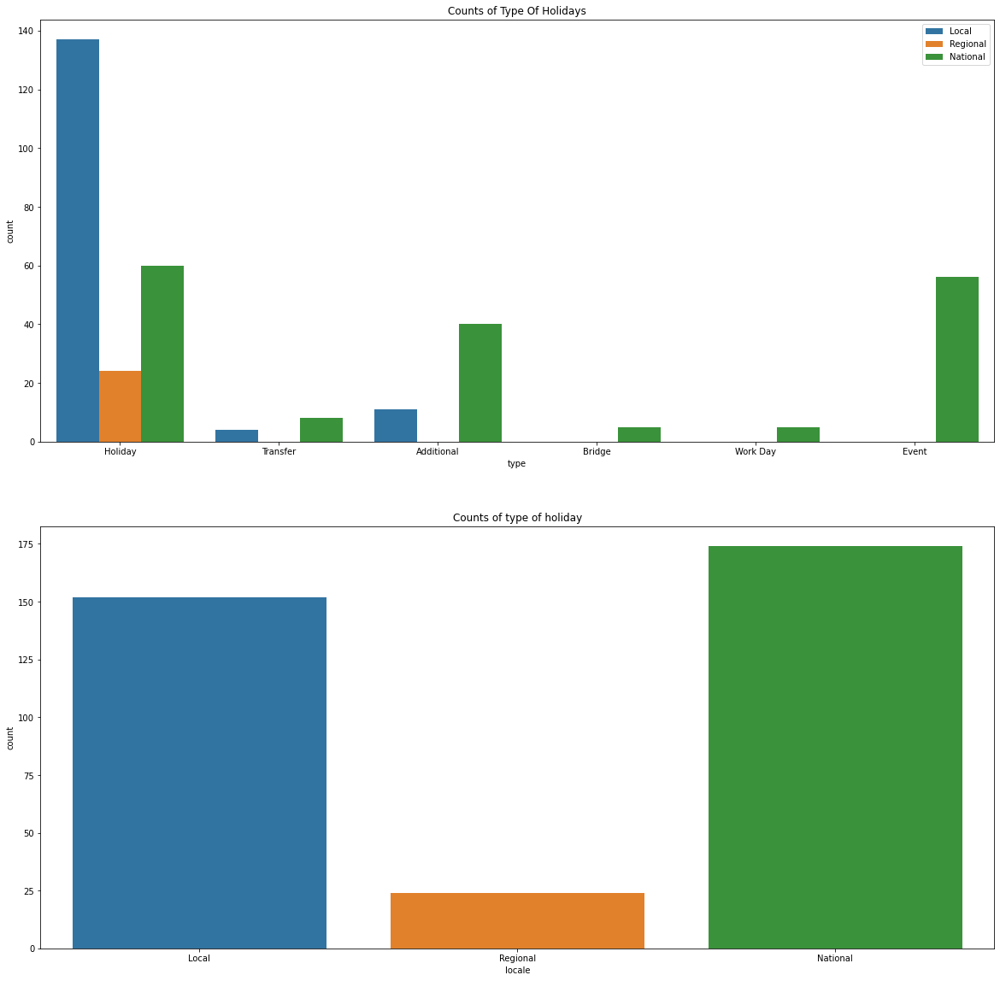

In [31]:
plt.subplots(1,2,figsize=(20,20))
plt.subplot(211) # 调用subplot(211)
plt.title('Counts of Type Of Holidays')
sns.countplot(x=holiday_table.type, hue=holiday_table.locale)
plt.legend(loc='upper right')
plt.subplot(212)
plt.title('Counts of type of holiday')
sns.countplot(x=holiday_table.locale)

In [32]:
import time
s=time.time()
#按照自己date_time的格式设置format
holiday_table_data = pd.to_datetime(holiday_table['date'], format="%Y-%m-%d")
holiday_table.insert(0,'day',holiday_table_data.dt.day)
holiday_table.insert(0,'month',holiday_table_data.dt.month)
holiday_table.insert(0,'year',holiday_table_data.dt.year)
# Delete transferred holidays and work days
holiday_table_clear = holiday_table.drop(holiday_table[(holiday_table['transferred'] == True) | (holiday_table['type'] == 'Work Day')].index)
print(holiday_table_clear)

     year  month  day        date        type    locale  \
0    2012      3    2  2012-03-02     Holiday     Local   
1    2012      4    1  2012-04-01     Holiday  Regional   
2    2012      4   12  2012-04-12     Holiday     Local   
3    2012      4   14  2012-04-14     Holiday     Local   
4    2012      4   21  2012-04-21     Holiday     Local   
5    2012      5   12  2012-05-12     Holiday     Local   
6    2012      6   23  2012-06-23     Holiday     Local   
7    2012      6   25  2012-06-25     Holiday  Regional   
8    2012      6   25  2012-06-25     Holiday     Local   
9    2012      6   25  2012-06-25     Holiday     Local   
10   2012      7    3  2012-07-03     Holiday     Local   
11   2012      7    3  2012-07-03     Holiday     Local   
12   2012      7   23  2012-07-23     Holiday     Local   
13   2012      8    5  2012-08-05     Holiday     Local   
14   2012      8   10  2012-08-10     Holiday  National   
15   2012      8   15  2012-08-15     Holiday     Local 

#### We can explore effect of holiday events on sales in following analysis.

### 3.3 Oil Table

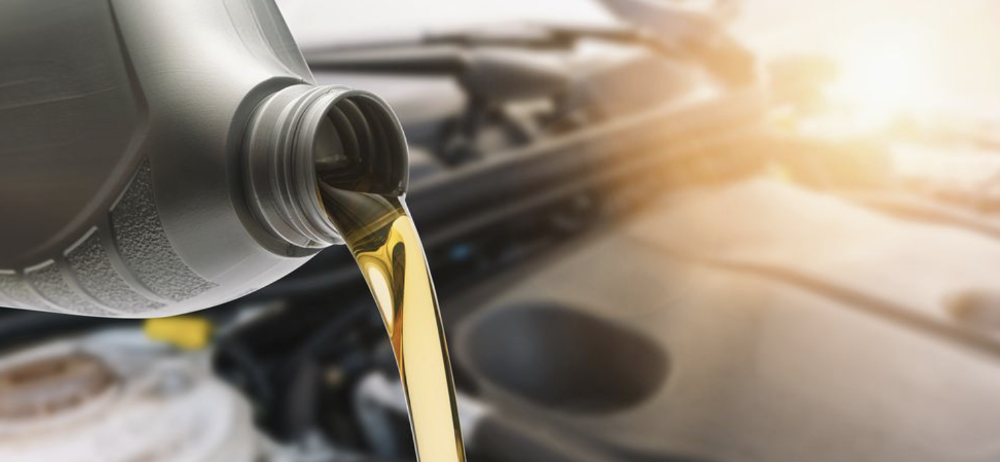

In [33]:
fig=px.line(oil_table,x='date',y='dcoilwtico',title='Oil price trend')
fig.show()

#### Based on the chart, we can see there's a sudden drop from September to November. We want to see detailed changes in this period.

In [34]:
# look at a particular month
import time
s=time.time()
#
#按照自己date_time的格式设置format
oil_time_data = pd.to_datetime(oil_table['date'], format="%Y-%m-%d")
oil_table.insert(0,'day',oil_time_data.dt.day)
oil_table.insert(0,'month',oil_time_data.dt.month)
oil_table.insert(0,'year',oil_time_data.dt.year)
oil_table.head()
oil_table = oil_table.drop(['date'],axis = 1)

#### Based on the oil price trend chart, we can see September is the turning point of every year so I want to see sales of September every year.

<AxesSubplot:xlabel='year', ylabel='dcoilwtico'>

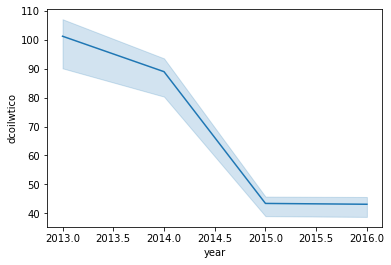

In [35]:
# look at a particular month
sep_oil = oil_table.query("month == 9")
sns.lineplot(data=sep_oil, x="year", y="dcoilwtico")

<AxesSubplot:xlabel='year'>

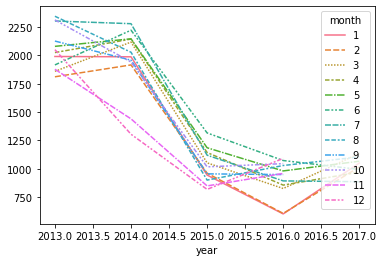

In [36]:
# Re-organize the data to the wide-form representation
oil_wide = oil_table[['year', 'month', 'dcoilwtico']].groupby(['year','month']).sum().reset_index()
oil_wide1 = oil_wide.pivot("year", "month", "dcoilwtico")
sns.lineplot(data=oil_wide1)

#### We can see a significant drop from 2014 to 2015 but it bouced back from March 2015. We estimated that oil price will effect sales durting this period so we decided to conduct a correlation check in following analysis.

### 3.4 Train Table

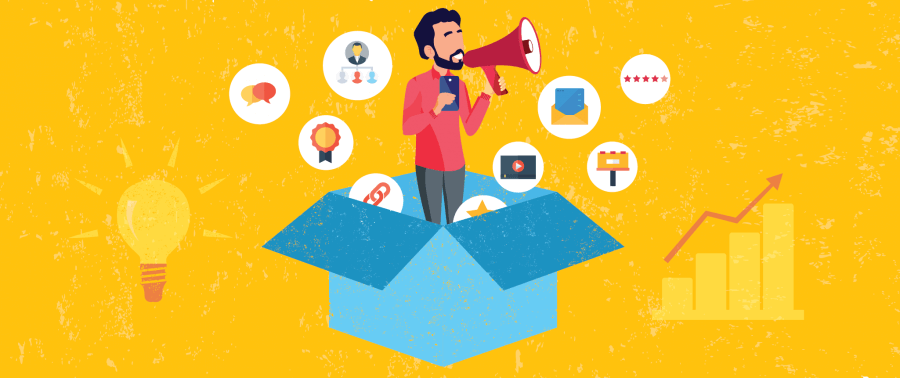

#### We want to see sales difference between product families:

<AxesSubplot:xlabel='sales', ylabel='family'>

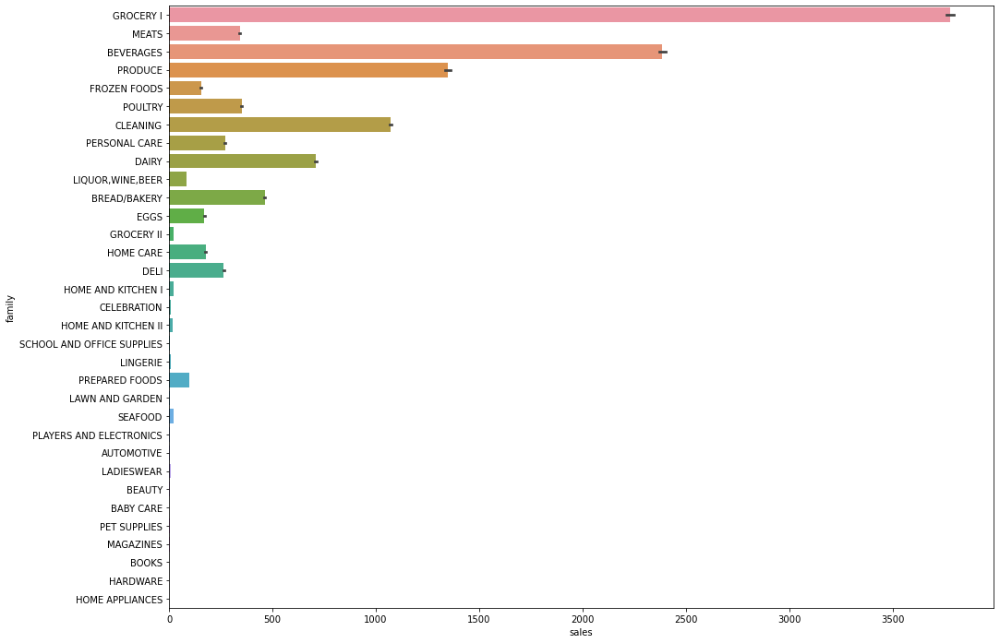

In [13]:
#See sales difference between families
from numpy import mean
plt.figure(figsize=(16,12))
sns.barplot(x="sales", y="family", data=train_table.sort_values(by=['sales','family'], ascending=False),label="Sales")

#### We can see grocery, beverages, produce, cleaning and dairy are top 5 product families; Seasonal products( school products, holiday products) , entertainment products and beauty products are relatively less than other families.

<Figure size 1728x1296 with 0 Axes>

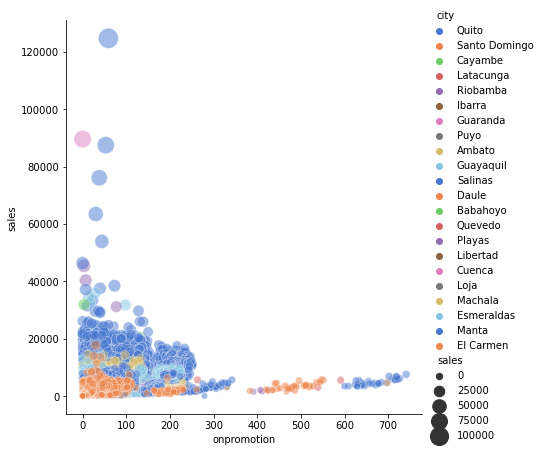

In [14]:
# Explore relationship by region
# Used Merged table: store_table and train_table: cluster_info
plt.figure(figsize=(24,18))
sns.relplot(x="onpromotion", y="sales", hue="city", size="sales",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=cluster_info)

#### We can see range of sales are fallen from 0 to 250. Regions of higher sales has promoted around 100 promotions.